# Analyzing images of singledoubletriple vertical lines

## Initialization

In [1]:
%load_ext autoreload
%autoreload 2
LOGGERDEFINED = False

In [2]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
module_path = os.path.abspath(os.path.join('..'))
sys.path.append(module_path)
sys.path.append(os.path.dirname(module_path))
from py.tools.config import cfg
import py.tools.logs as logs
import py.vid.v_tools as vt
import py.metrics.m_SDT as me
from py.im.imshow import imshow
import py.file.file_handling as fh
import pandas as pd
LOGGERDEFINED = logs.openLog('still_measure.ipynb', LOGGERDEFINED, level='DEBUG', exportLog=False)

# ML model

### generate input data

In [566]:
# export cropped images and table of their crop locations
folder = os.path.join(cfg.path.server, 'singleDoubleTriple\SO_S20-0.5\I_SO6-S20-0.5_S_4.00\I_SO6-S20-0.5_S_4.00_230215\disturbVert2_3_1.250')
exp = me.cropExporter(folder, me.fileVertSDT, mustMatch=['Vert'], overwrite=True)
exp.run()

INFO: Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO_S20-0.5\I_SO6-S20-0.5_S_4.00\I_SO6-S20-0.5_S_4.00_230215\disturbVert2_3_1.250\disturbVert2_3_1.250_cropLocs_I_SO6-S20-0.5_S_4.00_230215_190158_2.csv


[]

In [24]:
# copy all cropped files to a separate folder for easy file transfer to wipp
cropfolder = os.path.join(cfg.path.server, 'singleDoubleTriple', 'newCrops')
topfolder = os.path.join(cfg.path.server, r'singleDoubleTriple\SO_S20-0.5')
me.copyToMLInputFolder(cropfolder, topfolder, mustMatch=['Vert'], reg='.*o1.*')

//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\newCrops\disturbVert2_1_0.500_vcrop_V1_l0d1o1_I_SO6-S20-0.5_S_3.00_230215_105135_4.png
//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\newCrops\disturbVert2_1_0.500_vcrop_V1_l0w1o1_I_SO6-S20-0.5_S_3.00_230215_105135_4.png
//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\newCrops\disturbVert2_1_0.500_vcrop_V1_l1d1o1_I_SO6-S20-0.5_S_3.00_230215_105135_4.png
//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\newCrops\disturbVert2_1_0.500_vcrop_V1_l1w1o1_I_SO6-S20-0.5_S_3.00_230215_105135_4.png
//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\newCrops\disturbVert2_1_0.500_vcrop_V1_l2d1o1_I_SO6-S20-0.5_S_3.00_230215_105135_4.png
//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\newCrops\disturbVert2_1_0.500_vcrop_V1_l2w1o1_I_SO6-S20-0.5_S_3.00_230215_105135_4.pn

In [373]:
# find folders which are missing ML results and copy the files to the transfer folder
cropfolder = os.path.join(cfg.path.server, 'singleDoubleTripleML', 'newCrops')
topfolder = os.path.join(cfg.path.server, 'singleDoubleTriple')
missingFolders = me.findMissingML(topfolder, cropfolder, mustMatch=['Vert'])

//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO\I_SO10_S_3.50\I_SO10_S_3.50_230208\disturbVert2_1_0.500 1
//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO\I_SO10_S_3.50\I_SO10_S_3.50_230208\disturbVert2_2_0.625 48
//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO\I_SO10_S_4.00\I_SO10_S_4.00_230208\disturbVert2_1_0.625 1
//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO\I_SO11_S_4.00\I_SO11_S_4.00_230214\disturbVert2_3_0.625 25
//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO\I_SO11_S_4.00\I_SO11_S_4.00_230214\disturbVert2_3_0.750 84
//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO\I_SO11_S_4.00\I_SO11_S_4.00_230214\disturbVert2_3_0.875 84
//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO\I_SO11_S_4.00\I_SO11_S_4.00_230214\disturbVert2_3_1.000 84
//cfs2e.

### move output data to folders

In [567]:
# move ML segmented images from the output folder to the appropriate subfolders
for s in [7]:
    f = f'lf-unet-vert-SO-{s}-segment-outputDir'
    me.moveMLResults(os.path.join(cfg.path.server, r'singleDoubleTripleML\results', f, 'png'), 
                os.path.join(cfg.path.server, 'singleDoubleTriple'))

INFO: copied file to //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO_S20-0.5\I_SO6-S20-0.5_S_4.00\I_SO6-S20-0.5_S_4.00_230215\disturbVert2_3_1.250\MLsegment\disturbVert2_3_1.250_MLsegment_V3_l0w1o1_I_SO6-S20-0.5_S_4.00_230215_190158_2.png
INFO: copied file to //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO_S20-0.5\I_SO6-S20-0.5_S_4.00\I_SO6-S20-0.5_S_4.00_230215\disturbVert2_3_1.250\MLsegment\disturbVert2_3_1.250_MLsegment_V3_l0w1o2_I_SO6-S20-0.5_S_4.00_230215_190158_2.png
INFO: copied file to //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO_S20-0.5\I_SO6-S20-0.5_S_4.00\I_SO6-S20-0.5_S_4.00_230215\disturbVert2_3_1.250\MLsegment\disturbVert2_3_1.250_MLsegment_V3_l0w1o3_I_SO6-S20-0.5_S_4.00_230215_190158_2.png
INFO: copied file to //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO_S20-0.5\I_SO6-S20-0.5_S_4.00\I_SO6-S20-0.5_S_4.00_230215\disturbVert2_3_1.

# unsupervised model

In [7]:
# export just the segmented images
folder = os.path.join(cfg.path.server, r'singleDoubleTriple')
exp = me.segmentExporter(folder, me.fileVertSDT, mustMatch=['Vert'], overwrite=False)
errorList = exp.run()

//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO\I_SO10_S_3.00\I_SO10_S_3.00_230208\disturbVert2_1_0.500 True
Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO\I_SO10_S_3.00\I_SO10_S_3.00_230208\disturbVert2_1_0.500\Usegment\disturbVert2_1_0.500_Usegment_V1_l0d1o1_I_SO10_S_3.00_230208_100619_3.png
Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO\I_SO10_S_3.00\I_SO10_S_3.00_230208\disturbVert2_1_0.500\Usegment\disturbVert2_1_0.500_Usegment_V1_l0d1o2_I_SO10_S_3.00_230208_100619_3.png
Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO\I_SO10_S_3.00\I_SO10_S_3.00_230208\disturbVert2_1_0.500\Usegment\disturbVert2_1_0.500_Usegment_V1_l0d1o3_I_SO10_S_3.00_230208_100619_3.png
Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO\I_SO10_S_3.00\I_SO10_S_3.00_230208\disturbVert2_1_0.500\Usegment\distur

In [389]:
folder = os.path.join(cfg.path.server, r'singleDoubleTriple\SO\I_SO9_S_3.00\I_SO9_S_3.00_230207\disturbVert2_1_0.750')
exp = me.segmentExporter(folder, me.fileVertSDT, overwrite=True, exportDiag=2)
exp.run()

Exported disturbVert2_1_0.750_Usegment_V1_l0d1o1_I_SO9_S_3.00_230207_103843_1.png
Exported disturbVert2_1_0.750_Usegment_V1_l0d1o2_I_SO9_S_3.00_230207_103843_1.png
Exported disturbVert2_1_0.750_Usegment_V1_l0d1o3_I_SO9_S_3.00_230207_103843_1.png
Exported disturbVert2_1_0.750_Usegment_V1_l0d1o4_I_SO9_S_3.00_230207_103843_1.png
Exported disturbVert2_1_0.750_Usegment_V1_l0d1o5_I_SO9_S_3.00_230207_103843_1.png
Exported disturbVert2_1_0.750_Usegment_V1_l0d1o6_I_SO9_S_3.00_230207_103843_1.png
Exported disturbVert2_1_0.750_Usegment_V1_l0d1o7_I_SO9_S_3.00_230207_103843_1.png
Exported disturbVert2_1_0.750_Usegment_V1_l0d1o8_I_SO9_S_3.00_230207_103843_1.png
Exported disturbVert2_1_0.750_Usegment_V1_l0d1p1_I_SO9_S_3.00_230207_103843_1.png
Exported disturbVert2_1_0.750_Usegment_V1_l0d1p2_I_SO9_S_3.00_230207_103843_1.png
Exported disturbVert2_1_0.750_Usegment_V1_l0d1p3_I_SO9_S_3.00_230207_103843_1.png
Exported disturbVert2_1_0.750_Usegment_V1_l0d1p4_I_SO9_S_3.00_230207_103843_1.png
Exported disturb

[]

In [18]:
exp.fileErrorList

[]

#### individual files

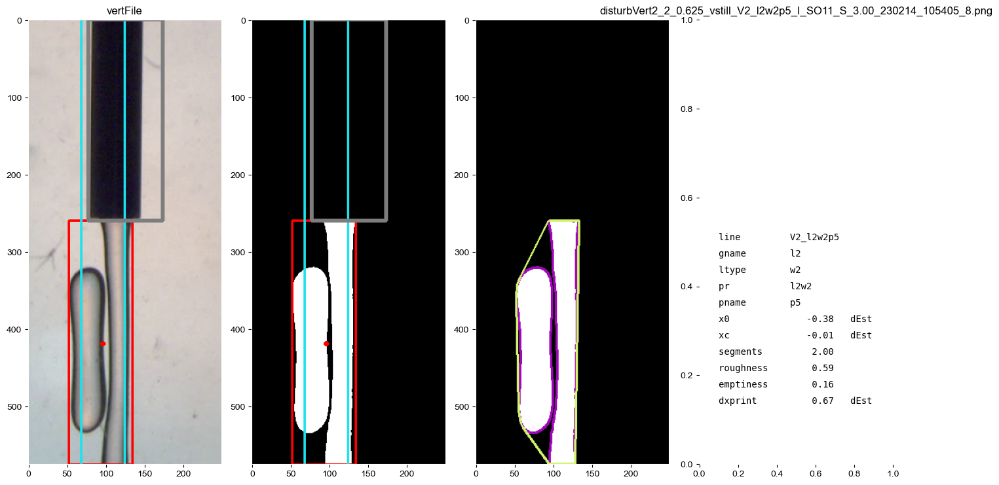

In [13]:
fstr = r'singleDoubleTriple\SO\I_SO11_S_3.00\I_SO11_S_3.00_230214\disturbVert2_2_0.625'
fistr = 'disturbVert2_2_0.625_vstill_V2_l2w2p5_I_SO11_S_3.00_230214_105405_8.png'
folder = os.path.join(cfg.path.server, fstr)
me.vertSDTTestFile(fstr, fistr, diag=1, overrideSegment=False)

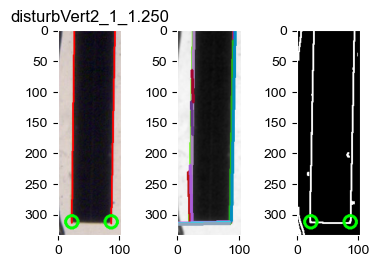

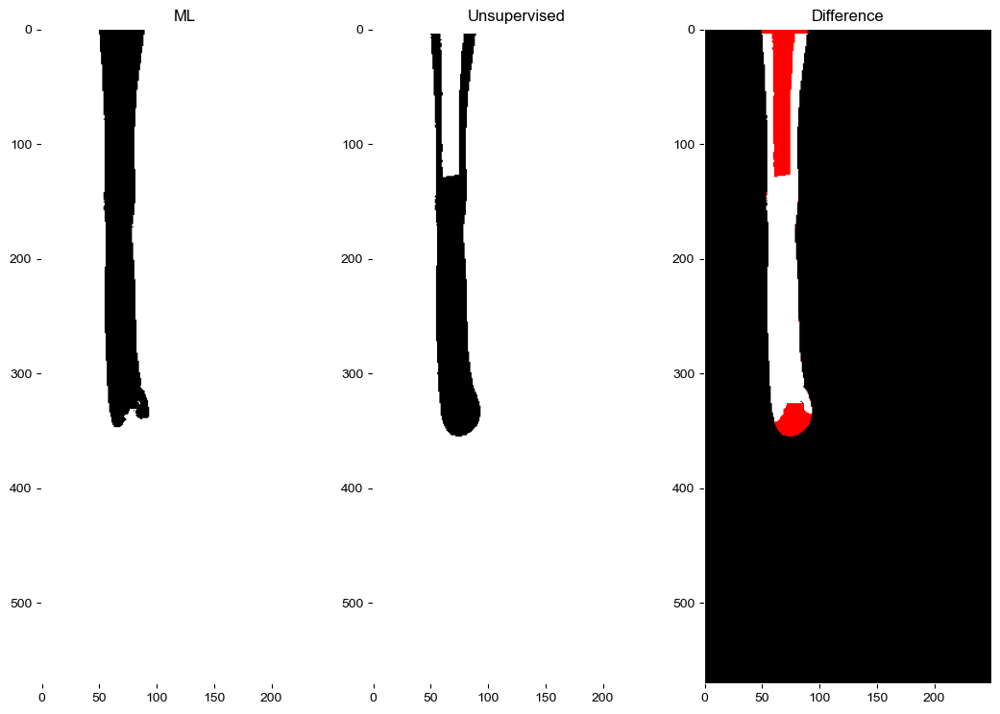

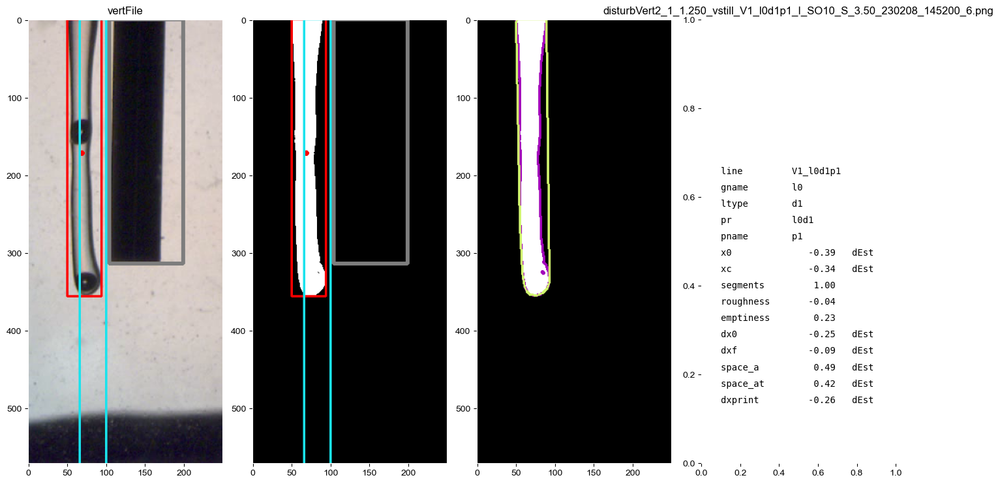

In [14]:
fstr = r'singleDoubleTriple\SO\I_SO10_S_3.50\I_SO10_S_3.50_230208\disturbVert2_1_1.250'
fistr = 'disturbVert2_1_1.250_vstill_V1_l0d1p1_I_SO10_S_3.50_230208_145200_6.png'
folder = os.path.join(cfg.path.server, fstr)
me.vertSDTTestFile(fstr, fistr, diag=4, overrideSegment=False)

INFO: Exported C:\Users\lmf1\Documents\GitHub\embedded3DPvids\tests\test_SDTVert.csv


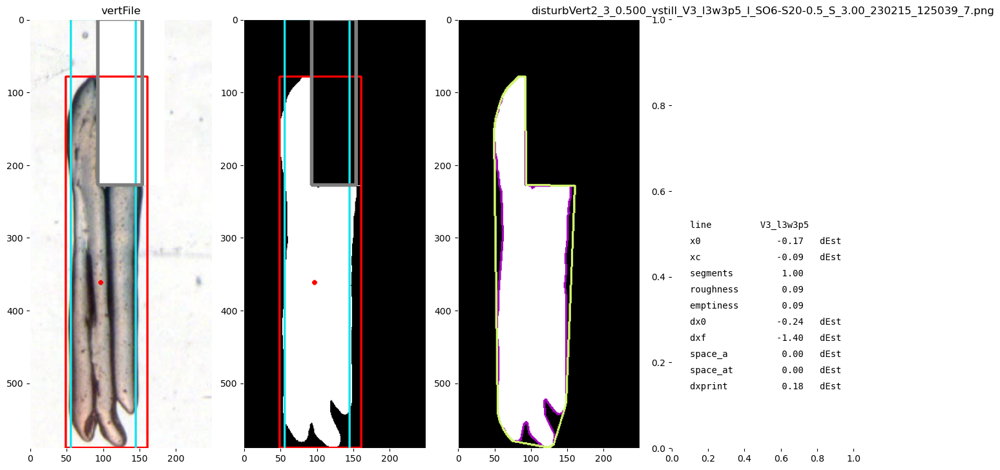

In [45]:
me.addVertToTestFile('SDTVert', fstr, fistr, diag=1)

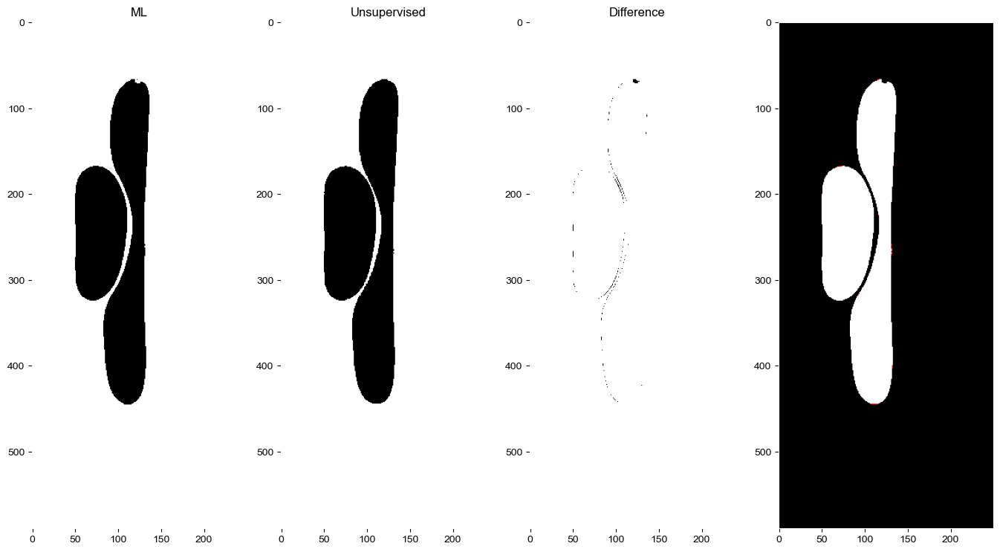

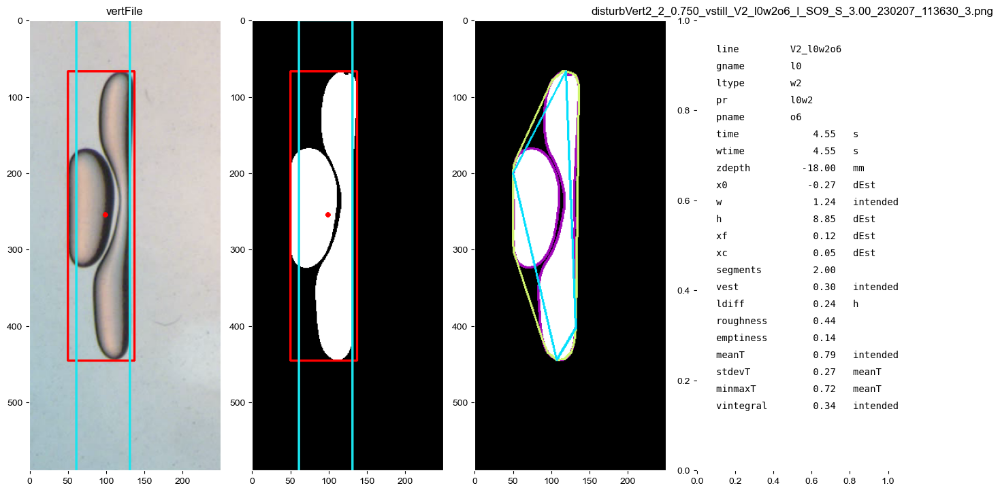

In [145]:
fstr = r'singleDoubleTriple\SO\I_SO9_S_3.00\I_SO9_S_3.00_230207\disturbVert2_2_0.750'
fistr = 'disturbVert2_2_0.750_vstill_V2_l0w2o6_I_SO9_S_3.00_230207_113630_3.png'
folder = os.path.join(cfg.path.server, fstr)
vs = me.fileVertSDT(os.path.join(folder, fistr), diag=2, overrideSegment=False, overwrite=False)

In [324]:
fstr = r'singleDoubleTriple\SO\I_SO9_S_3.00\I_SO9_S_3.00_230207\disturbVert2_2_0.750'
fistr = 'disturbVert2_2_0.750_vstill_V2_l0w2o6_I_SO9_S_3.00_230207_113630_3.png'
folder = os.path.join(cfg.path.server, fstr)
vs = me.fileVertSDT(os.path.join(folder, fistr), diag=2, measure=False)

### creating training data

In [27]:
tg = me.trainingGenerator(os.path.join(cfg.path.server, 'singleDoubleTriple')
                          , excludeFolders=[os.path.join(cfg.path.fig, 'singleDoubleTriple\trainingVert\segmented'),
                                          os.path.join(cfg.path.fig, 'singleDoubleTriple\trainingVert\evaluate\segmented')]
                          , mustMatch='disturbVert')

In [31]:
file = tg.randomFile()

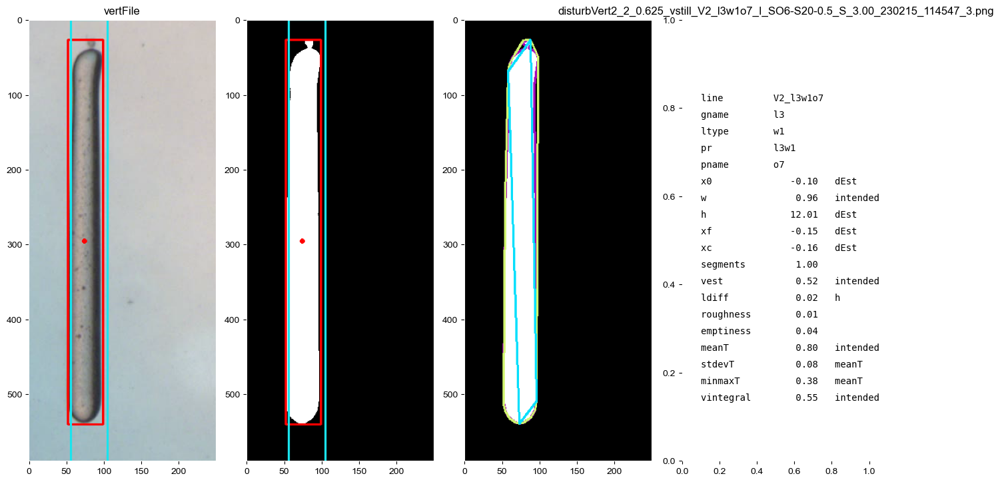

In [32]:
vs = me.fileVertSDT(file, diag=1, overrideSegment=False)

In [485]:
# add to training as is
vs.addToTraining(trainFolder=r'singleDoubleTriple\trainingVert\evaluate')

Exported disturbVert2_2_1.000_vstill_V2_l3w1o1_I_SO6-S20-0.5_S_3.50_230215_153028_8.png to training data


In [476]:
# add to training, but open paint
vs.addToTraining(trainFolder=r'singleDoubleTriple\trainingVert\evaluate', openPaint=True)

Exported disturbVert2_1_1.000_vstill_V1_l0d1p1_I_SO9_S_3.50_230207_144705_1.png to training data


In [373]:
# add thresh to training and open paint
vs.addToTraining(s='thresh', trainFolder=r'singleDoubleTriple\trainingVert\evaluate')

Exported disturbVert2_3_0.750_vstill_V3_l1w3p5_I_SO6-S20-0.5_S_4.00_230215_185625_8.png to training data


In [10]:
me.convertFilesToBW(r'C:\Users\lmf1\OneDrive - NIST\NIST\data\shopbot\results\singleDoubleTriple\trainingVert\segmented', diag=True)

(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(587, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(574, 250, 3) [0 1] [0 0 0]
(532, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(517, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(588, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(543, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(512, 250, 3) [0 1] [0 0 0]
(583, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] [0 0 0]
(590, 250, 3) [0 1] 

### unit test

test_SDTVert


....F.......................F.......
FAIL: runTest (test_SDTVert.TestSDTXS)
----------------------------------------------------------------------
AssertionError: False is not true : test_x0 failed in //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO\I_SO10_S_4.00\I_SO10_S_4.00_230208\disturbVert2_2_0.625\disturbVert2_2_0.625_vstill_V2_l1w2p5_I_SO10_S_4.00_230208_175927_8.png: 4

FAIL: runTest (test_SDTVert.TestSDTXS)
----------------------------------------------------------------------
AssertionError: False is not true : test_emptiness failed in //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO_S20-0.5\I_SO6-S20-0.5_S_3.50\I_SO6-S20-0.5_S_3.50_230215\disturbVert2_2_0.875\disturbVert2_2_0.875_vstill_V2_l1w2p2_I_SO6-S20-0.5_S_3.50_230215_152838_3.png: 28

----------------------------------------------------------------------
Ran 36 tests in 9.385s

FAILED (failures=2)


TEST 4 (excel row 6)
Folder: singleDoubleTriple\SO\I_SO10_S_4.00\I_SO10_S_4.00_230208\disturbVert2_2_0.625
File: disturbVert2_2_0.625_vstill_V2_l1w2p5_I_SO10_S_4.00_230208_175927_8.png


,emptiness,x0,segments
expected,0.32741383,-0.42204306,2.0
actual,0.33143918,-0.38700697,3.0


TEST 28 (excel row 30)
Folder: singleDoubleTriple\SO_S20-0.5\I_SO6-S20-0.5_S_3.50\I_SO6-S20-0.5_S_3.50_230215\disturbVert2_2_0.875
File: disturbVert2_2_0.875_vstill_V2_l1w2p2_I_SO6-S20-0.5_S_3.50_230215_152838_3.png


,emptiness,x0,segments
expected,0.19854741,-0.35789573,2.0
actual,0.16870706,-0.19111790,2.0


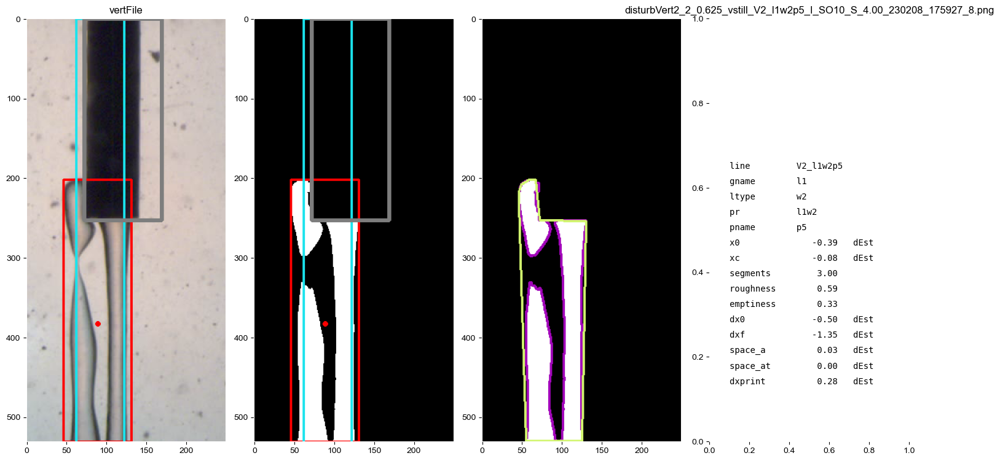

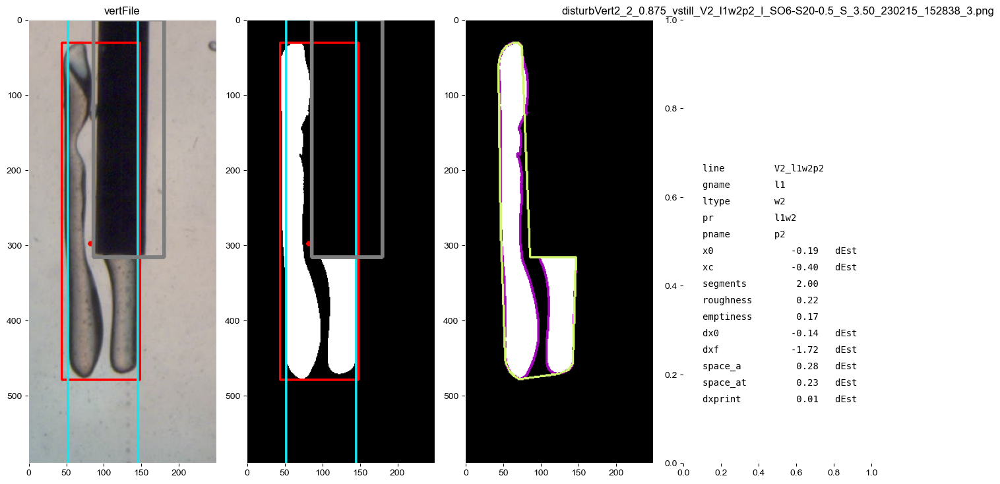

In [142]:
ut = me.unitTester('SDTVert', me.vertSDTMeasure)
ut.run()
ut.compareAll()

TEST 9 (excel row 11)
Folder: singleDoubleTriple\SO\I_SO9_S_3.00\I_SO9_S_3.00_230207\disturbXS2_2_+z_0.625
File: disturbXS2_2_+z_0.625_vstill_HOx2_l1w2o1_I_SO9_S_3.00_230207_120037_4.png
TEST 10 (excel row 12)
Folder: singleDoubleTriple\SO\I_SO9_S_3.00\I_SO9_S_3.00_230207\disturbXS2_2_+z_0.625
File: disturbXS2_2_+z_0.625_vstill_HOx2_l2d2o2_I_SO9_S_3.00_230207_120037_4.png
TEST 13 (excel row 15)
Folder: singleDoubleTriple\SO\I_SO11_S_4.00\I_SO11_S_4.00_230214\disturbXS2_1_+y_1.000
File: disturbXS2_1_+y_1.000_vstill_HIx1_l0w1_I_SO11_S_4.00_230214_165121_1.png
TEST 15 (excel row 17)
Folder: singleDoubleTriple\SO_S20-0.5\I_SO6-S20-0.5_S_4.00\I_SO6-S20-0.5_S_4.00_230215\disturbXS2_3_+y_1.250
File: disturbXS2_3_+y_1.250_vstill_HIx3_l3w3o1_I_SO6-S20-0.5_S_4.00_230215_191445_2.png
TEST 16 (excel row 18)
Folder: singleDoubleTriple\SO_S20-0.5\I_SO6-S20-0.5_S_4.00\I_SO6-S20-0.5_S_4.00_230215\disturbXS2_3_+y_1.250
File: disturbXS2_3_+y_1.250_vstill_HIx3_l0w2_I_SO6-S20-0.5_S_4.00_230215_191445_2.pn

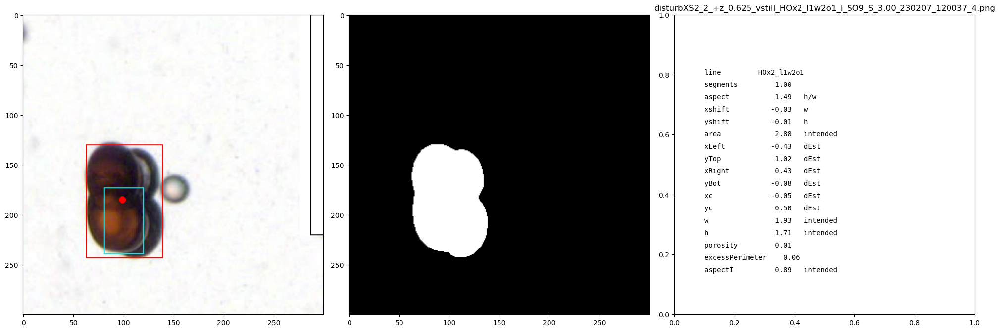

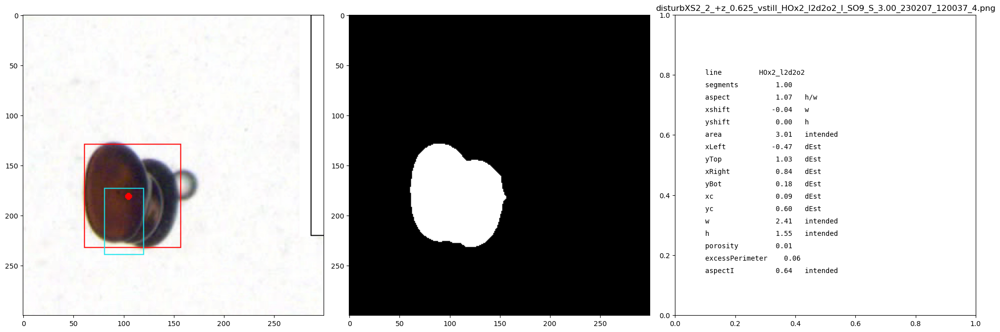

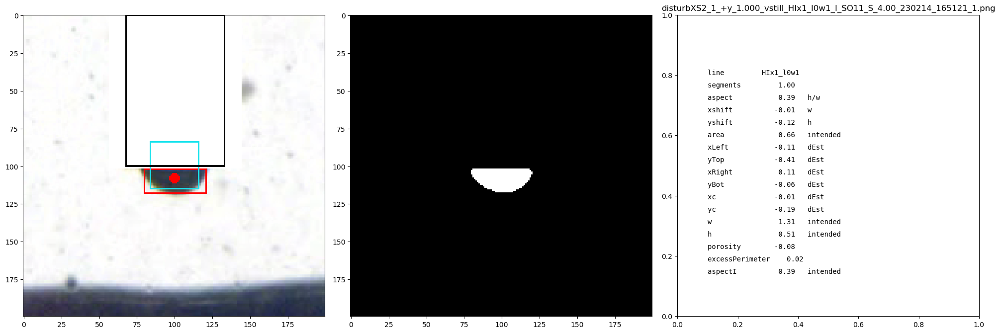

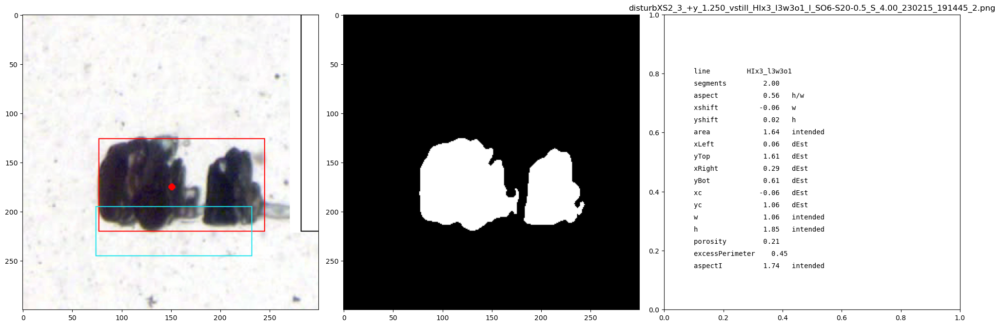

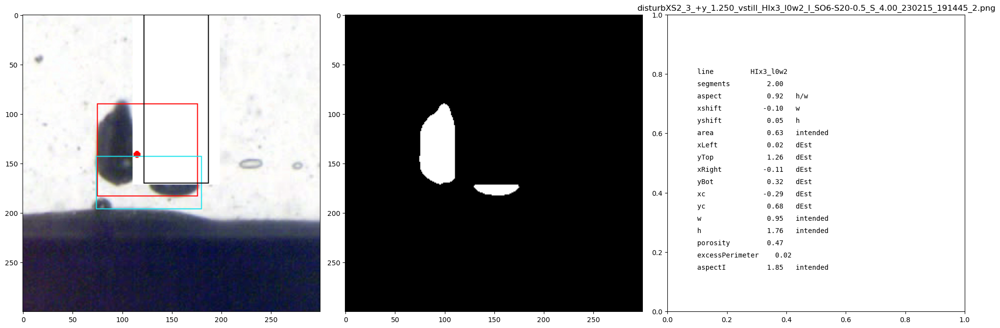

In [114]:
ut.keepAllTests()

In [141]:
i = ut.failedFiles[13]
ut.compareTest(i, diag=3, overrideSegment=False)

IndexError: list index out of range

TEST 35 (excel row 37)
Folder: singleDoubleTriple\SO_S20-0.5\I_SO6-S20-0.5_S_3.00\I_SO6-S20-0.5_S_3.00_230215\disturbVert2_3_0.500
File: disturbVert2_3_0.500_vstill_V3_l3w3p5_I_SO6-S20-0.5_S_3.00_230215_125039_7.png
INFO: Exported C:\Users\lmf1\Documents\GitHub\embedded3DPvids\tests\test_SDTVert.csv


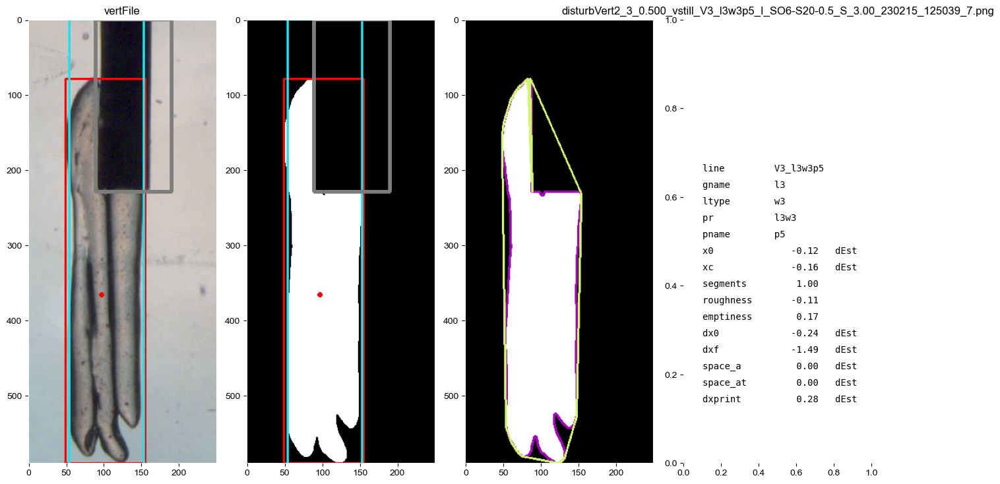

In [140]:
ut.keepTest(i)

In [180]:
ut.openCSV()

In [37]:
ut.openExplorer(i)

# compare to manual segmentation

#### unsupervised model

In [513]:
sc = me.segmentCompare(r'C:\Users\lmf1\OneDrive - NIST\NIST\data\shopbot\results\singleDoubleTriple\trainingVert\evaluate\segmented'
                       , os.path.join(cfg.path.server, 'singleDoubleTriple')
                       , r'C:\Users\lmf1\OneDrive - NIST\NIST\data\shopbot\results\singleDoubleTriple\trainingVert\evaluate\orig'
                        , me.vertSegmentSDT)
sc.compare()

Success rate: 0.918, Average diff: 0.008
    result  difference
1    Found      0.2440
111  Found      0.1814
109  Found      0.1388
86   Found      0.1068
132  Found      0.0786
73   Found      0.0707
140  Found      0.0534
145  Found      0.0516
82   Found      0.0450
127  Found      0.0412
74   Found      0.0307
33   Found      0.0184
Red = algorithm, green = manual


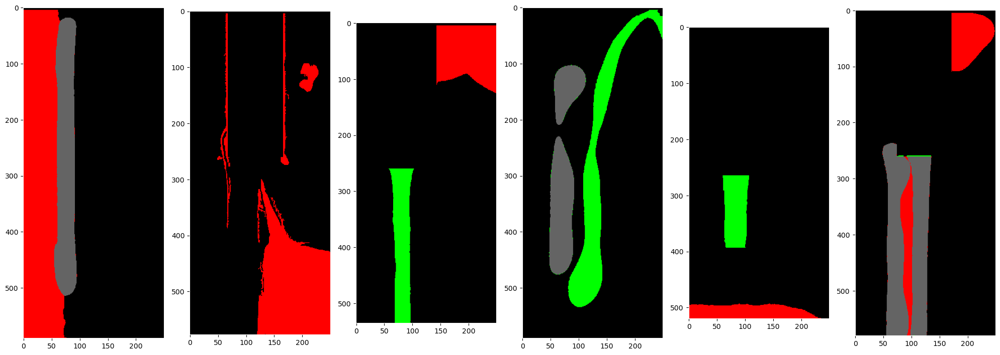

In [542]:
sc.showWorstSegmentation()

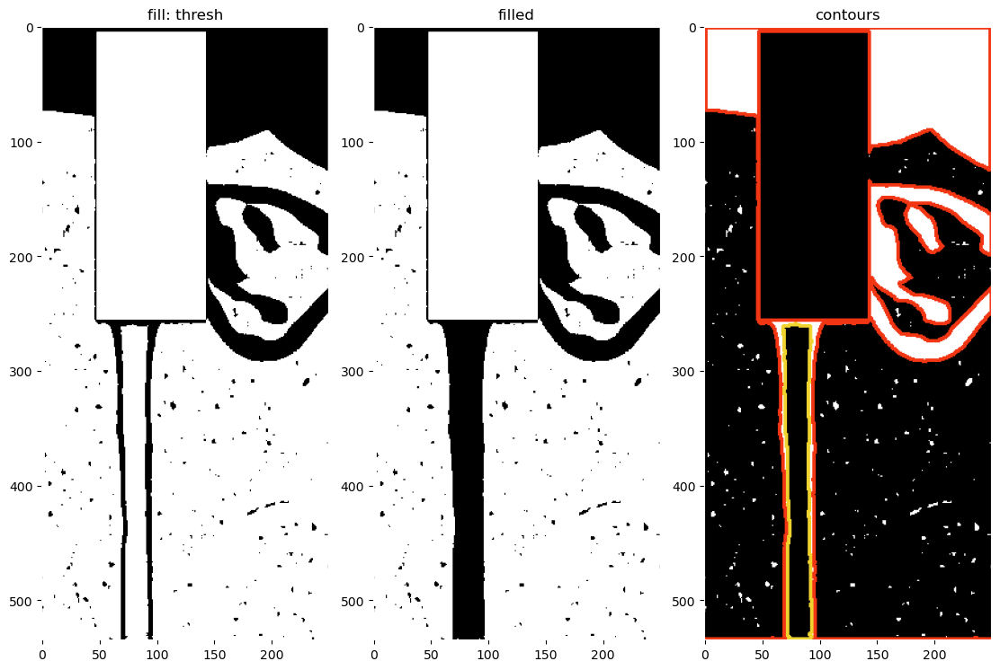

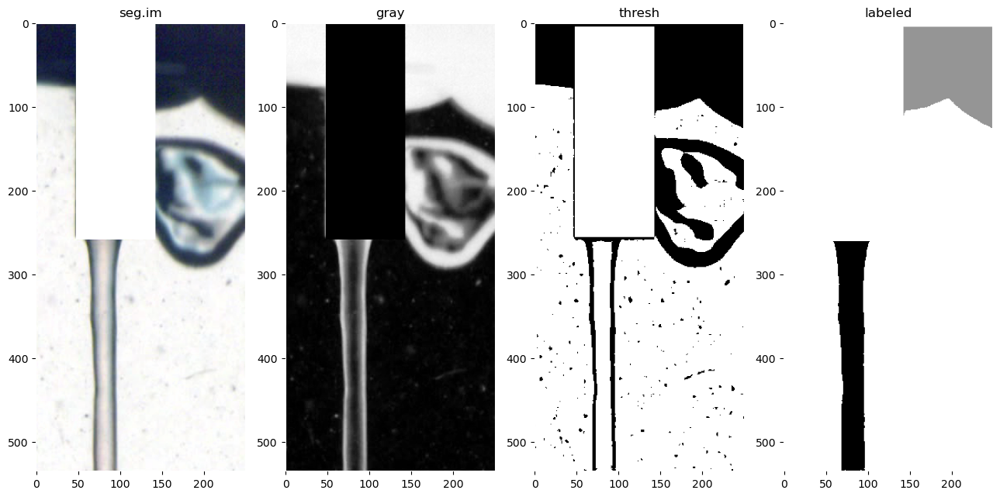

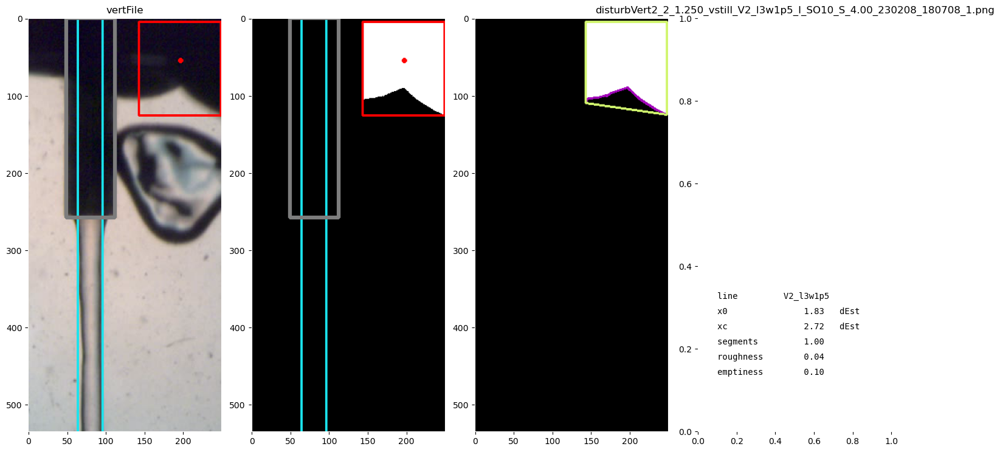

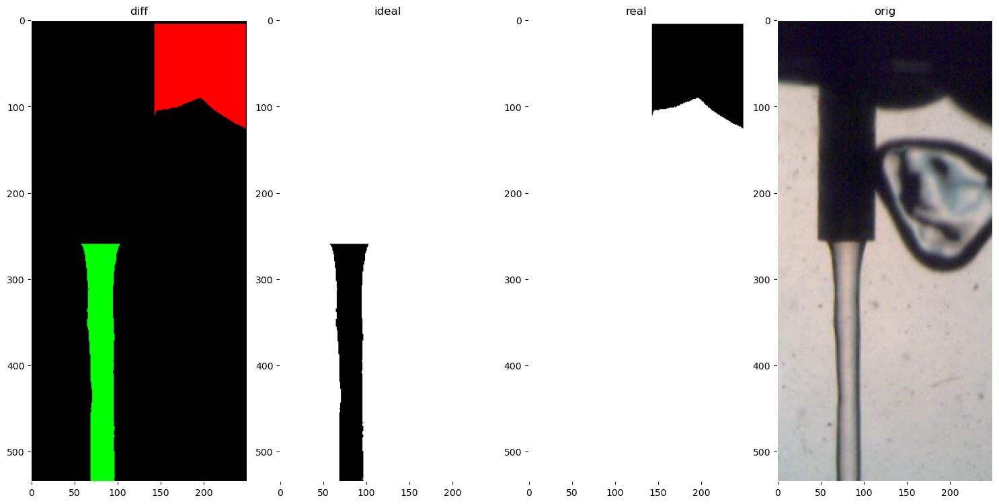

In [543]:
sc.compareFile(109, diag=4)

#### ML model

In [18]:
me.removeOme(r'C:\Users\lmf1\OneDrive - NIST\NIST\data\shopbot\results\singleDoubleTriple\trainingVert\evaluate\png')

In [19]:
scm = me.segmentCompare(r'C:\Users\lmf1\OneDrive - NIST\NIST\data\shopbot\results\singleDoubleTriple\trainingVert\evaluate\segmented'
                       , r'C:\Users\lmf1\OneDrive - NIST\NIST\data\shopbot\results\singleDoubleTriple\trainingVert\evaluate\png'
                       , r'C:\Users\lmf1\OneDrive - NIST\NIST\data\shopbot\results\singleDoubleTriple\trainingVert\evaluate\orig'
                        , 'folder')

In [20]:
scm.compare()

Success rate: 0.873, Average diff: 0.006
    result  difference
1    Found      0.1071
86   Found      0.0260
66   Found      0.0239
144  Found      0.0222
117  Found      0.0207
77   Found      0.0195
115  Found      0.0177
111  Found      0.0174
2    Found      0.0164
10   Found      0.0160
126  Found      0.0145
82   Found      0.0134
Red = algorithm, green = manual


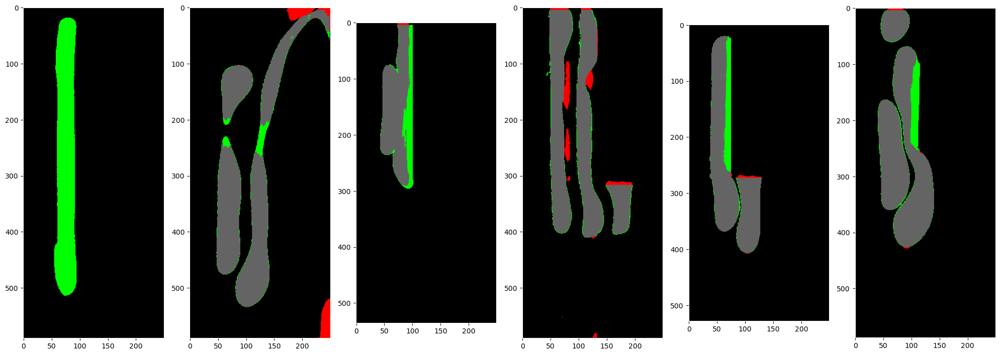

In [21]:
scm.showWorstSegmentation()

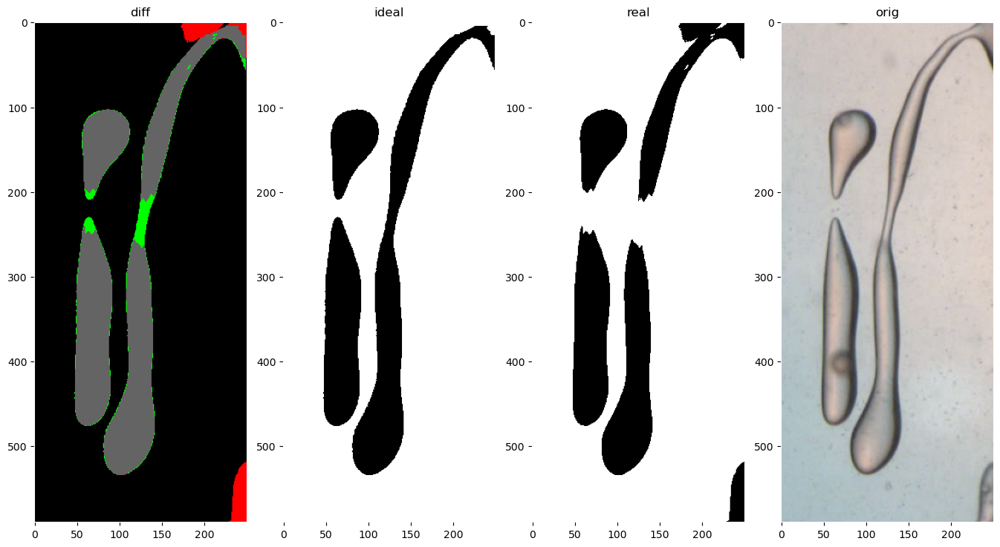

In [22]:
scm.compareFile(86, diag=2)

### summary

In [572]:
fstr = r'singleDoubleTriple\SO\I_SO11_S_3.00\I_SO11_S_3.00_230214\disturbVert2_1_1.000'
folder = os.path.join(cfg.path.server, fstr)

In [573]:
fh.openExplorer(folder)

In [574]:
fv = me.folderVertSDT(folder, overwriteMeasure=False, overwriteSummary=False)
fv.measureFolder()
fv.summarize()

INFO: Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO\I_SO11_S_3.00\I_SO11_S_3.00_230214\disturbVert2_1_1.000\disturbVert2_1_1.000_summary_I_SO11_S_3.00_230214_101414_0.csv


({'printFolder': '//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\\singleDoubleTriple\\SO\\I_SO11_S_3.00\\I_SO11_S_3.00_230214\\disturbVert2_1_1.000',
  'bn': 'I_SO11_S_3.00',
  'date': 230214,
  'sigma': 37.8013,
  'fluFile': True,
  'calibFile': True,
  'spacing': 1.0,
  'vRatio': 1.0,
  'dEst': 0.603,
  'viscRatio': 0.02169293025880809,
  'rGrav': -18268965.517241452,
  'int_Re': 0.00025620682272686936,
  'ReRatio': 0.0977549033370541,
  'hDragP': 39.48964511443114,
  'vDragP': 10.187584169884158,
  'int_CaInv': 0.1590225599386764,
  'pressureCh0': 192248.51321212275,
  'ink_shortname': 'SO11',
  'ink_days': 1,
  'ink_rheModifier': 'Aerosil R812S',
  'ink_surfactant': '',
  'ink_surfactantWt': '',
  'ink_dye': 'red',
  'ink_var': 'w% silica',
  'ink_val': 11.0,
  'ink_base': 'silicone oil',
  'ink_type': 'silicone oil',
  'ink_tau0': 1.10118,
  'ink_eta0': 16.8629736842105,
  'ink_density': 1.01,
  'ink_v': 10.0,
  'ink_rate': 16.58374792703151,
  'ink_visc0': 0.5156632

In [190]:
fv.importMeasure()

In [48]:
fv.df.columns

Index(['line', 'gname', 'ltype', 'pr', 'pname', 'time', 'wtime', 'zdepth',
       'x0', 'w', 'h', 'xf', 'xc', 'segments', 'vest', 'ldiff', 'roughness',
       'emptiness', 'meanT', 'stdevT', 'minmaxT', 'vintegral', 'space_a',
       'dx0', 'dxf', 'space_at', 'dxprint'],
      dtype='object')

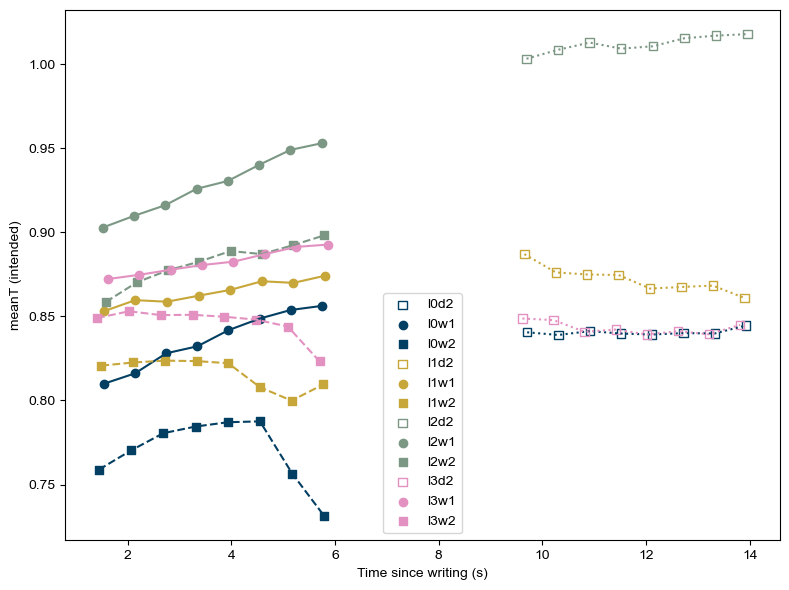

In [150]:
fv.plotValue('meanT')

In [184]:
fv.printAll()

//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO\I_SO9_S_3.00\I_SO9_S_3.00_230207\disturbVert2_2_0.750


,value,SE,N,units
x0_w1p,-0.0475,0.0038,20.0,dEst
dxprint_w1p,0.0776,0.0073,20.0,dEst
segments_w1p,1.0000,0.0000,20.0,
x0_w1o,-0.1489,0.0076,32.0,dEst
w_w1o,1.0978,0.0070,32.0,intended
h_w1o,9.3765,0.1509,32.0,dEst
xf_w1o,-0.0612,0.0031,32.0,dEst
xc_w1o,-0.1299,0.0053,32.0,dEst
segments_w1o,1.0000,0.0000,32.0,
roughness_w1o,0.0019,0.0007,32.0,


# summarize

In [575]:
fstr = r'singleDoubleTriple'
folder = os.path.join(cfg.path.server, fstr)
sv = me.summarizerVertSDT(folder, overwriteMeasure=False, overwriteSummary=False)

In [576]:
sv.run()

[]

In [577]:
sv.export()

INFO: Exported C:/Users/lmf1/OneDriveNIST/NIST/data/shopbot/results\singleDoubleTriple\summaries\VertSDTSummaries.csv
INFO: Exported C:/Users/lmf1/OneDriveNIST/NIST/data/shopbot/results\singleDoubleTriple\summaries\VertSDTFailures.csv


In [568]:
sv.testFolderError(0)

{'folder': '//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\\singleDoubleTriple\\SO_S20-0.5\\I_SO6-S20-0.5_S_4.00\\I_SO6-S20-0.5_S_4.00_230215\\disturbVert2_3_1.250', 'error': AttributeError("'list' object has no attribute 'line'")}
Exported disturbVert2_3_1.250_Usegment_V3_l0w1p1_I_SO6-S20-0.5_S_4.00_230215_190158_2.png
INFO: Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO_S20-0.5\I_SO6-S20-0.5_S_4.00\I_SO6-S20-0.5_S_4.00_230215\disturbVert2_3_1.250\disturbVert2_3_1.250_failures_I_SO6-S20-0.5_S_4.00_230215_190158_2.csv
INFO: Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO_S20-0.5\I_SO6-S20-0.5_S_4.00\I_SO6-S20-0.5_S_4.00_230215\disturbVert2_3_1.250\disturbVert2_3_1.250_measure_I_SO6-S20-0.5_S_4.00_230215_190158_2.csv


In [561]:
fh.openExplorer(sv.folderErrorList[0]['folder'])

In [582]:
folder = os.path.join(cfg.path.server, r'singleDoubleTriple\SO\I_SO11_S_3.00\I_SO11_S_3.00_230214\disturbVert2_1_1.000')
for f in os.listdir(folder):
    if 'l0' in f:
        fvs = me.fileVertSDT(os.path.join(folder, f), measure=False)
        fvs.disableFile()

Exported disturbVert2_1_1.000_Usegment_V1_l0d1o1_I_SO11_S_3.00_230214_101414_0.png
Exported disturbVert2_1_1.000_MLsegment_V1_l0d1o1_I_SO11_S_3.00_230214_101414_0.png
Exported disturbVert2_1_1.000_Usegment_V1_l0d1o2_I_SO11_S_3.00_230214_101414_0.png
Exported disturbVert2_1_1.000_MLsegment_V1_l0d1o2_I_SO11_S_3.00_230214_101414_0.png
Exported disturbVert2_1_1.000_Usegment_V1_l0d1o3_I_SO11_S_3.00_230214_101414_0.png
Exported disturbVert2_1_1.000_MLsegment_V1_l0d1o3_I_SO11_S_3.00_230214_101414_0.png
Exported disturbVert2_1_1.000_Usegment_V1_l0d1o4_I_SO11_S_3.00_230214_101414_0.png
Exported disturbVert2_1_1.000_MLsegment_V1_l0d1o4_I_SO11_S_3.00_230214_101414_0.png
Exported disturbVert2_1_1.000_Usegment_V1_l0d1o5_I_SO11_S_3.00_230214_101414_0.png
Exported disturbVert2_1_1.000_MLsegment_V1_l0d1o5_I_SO11_S_3.00_230214_101414_0.png
Exported disturbVert2_1_1.000_Usegment_V1_l0d1o6_I_SO11_S_3.00_230214_101414_0.png
Exported disturbVert2_1_1.000_MLsegment_V1_l0d1o6_I_SO11_S_3.00_230214_101414_0.pn

# go over failures

In [332]:
ft = me.failureTest(os.path.join(cfg.path.fig, 'singleDoubleTriple', 'summaries', 'VertSDTFailures.csv'), me.fileVertSDT)

201 failed files, 48 failed folders


In [522]:
ft.export()

INFO: Exported C:/Users/lmf1/OneDriveNIST/NIST/data/shopbot/results\singleDoubleTriple\summaries\VertSDTFailures.csv


In [526]:
ft.approveFile(i)
i = ft.firstBadFile()
ft.testFile(i, diag=1)

0 failed files, 0 failed folders


IndexError: single positional indexer is out-of-bounds

In [336]:
ft.approveFile(i)

144 failed files, 40 failed folders


Row 196, approved False


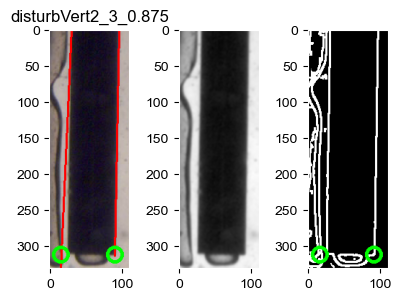

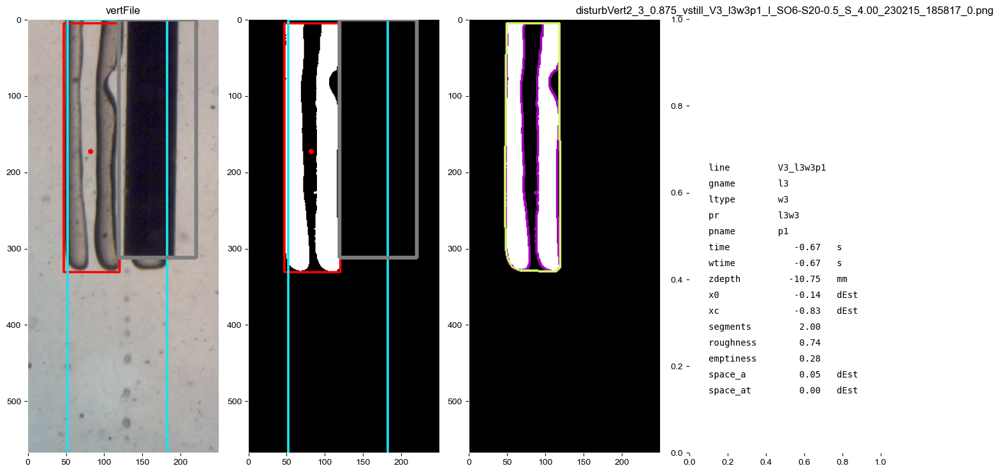

In [514]:
ft.testFile(i, diag=3, overrideSegment=False)

In [495]:
ft.openFolder(i)

In [338]:
ft.disableFile(i)

Exported disturbVert2_3_0.500_Usegment_V3_l1w3o3_I_SO10_S_4.00_230208_184846_0.png
Exported disturbVert2_3_0.500_MLsegment_V3_l1w3o3_I_SO10_S_4.00_230208_184846_0.png


In [448]:
ft.openPaint(i-1)

In [515]:
fvs = me.folderVertSDT(ft.folder(i), overwriteMeasure=True, overwriteSummary=True, overrideSegment=False)
fvs.measureFolder()
fvs.summarize()

Exported disturbVert2_3_0.875_Usegment_V3_l0w1o1_I_SO6-S20-0.5_S_4.00_230215_185817_0.png
Exported disturbVert2_3_0.875_Usegment_V3_l0w1o2_I_SO6-S20-0.5_S_4.00_230215_185817_0.png
Exported disturbVert2_3_0.875_Usegment_V3_l0w1o3_I_SO6-S20-0.5_S_4.00_230215_185817_0.png
Exported disturbVert2_3_0.875_Usegment_V3_l0w1o4_I_SO6-S20-0.5_S_4.00_230215_185817_0.png
Exported disturbVert2_3_0.875_Usegment_V3_l0w1o5_I_SO6-S20-0.5_S_4.00_230215_185817_0.png
Exported disturbVert2_3_0.875_Usegment_V3_l0w1o6_I_SO6-S20-0.5_S_4.00_230215_185817_0.png
Exported disturbVert2_3_0.875_Usegment_V3_l0w1o7_I_SO6-S20-0.5_S_4.00_230215_185817_0.png
Exported disturbVert2_3_0.875_Usegment_V3_l0w1o8_I_SO6-S20-0.5_S_4.00_230215_185817_0.png
Exported disturbVert2_3_0.875_Usegment_V3_l0w1p1_I_SO6-S20-0.5_S_4.00_230215_185817_0.png
Exported disturbVert2_3_0.875_Usegment_V3_l0w1p2_I_SO6-S20-0.5_S_4.00_230215_185817_0.png
Exported disturbVert2_3_0.875_Usegment_V3_l0w1p3_I_SO6-S20-0.5_S_4.00_230215_185817_0.png
Exported d

({'printFolder': '//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\\singleDoubleTriple\\SO_S20-0.5\\I_SO6-S20-0.5_S_4.00\\I_SO6-S20-0.5_S_4.00_230215\\disturbVert2_3_0.875',
  'bn': 'I_SO6-S20-0.5_S_4.00',
  'date': 230215,
  'sigma': 1.7649,
  'fluFile': True,
  'calibFile': True,
  'spacing': 0.875,
  'vRatio': 1.0,
  'dEst': 0.603,
  'viscRatio': 0.0030457788157961007,
  'rGrav': -44122307.8280304,
  'int_Re': 5.320167053044482e-05,
  'ReRatio': 0.6770990295968962,
  'hDragP': 184.52420977125576,
  'vDragP': 47.603768354429995,
  'int_CaInv': 0.0015889198280566903,
  'pressureCh0': 71259.83653639178,
  'ink_shortname': 'SO6-S20-0.5',
  'ink_days': 1,
  'ink_rheModifier': 'Aerosil R812S',
  'ink_surfactant': 'Span 20',
  'ink_surfactantWt': 0.5,
  'ink_dye': 'red',
  'ink_var': 'w% silica',
  'ink_val': 6.0,
  'ink_base': 'silicone oil',
  'ink_type': 'silicone oil_Span 20_0.5',
  'ink_tau0': 0.701812,
  'ink_eta0': 7.23680999999999,
  'ink_density': 0.98,
  'ink_v': 10.0

In [516]:
fvs.printAll()

//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO_S20-0.5\I_SO6-S20-0.5_S_4.00\I_SO6-S20-0.5_S_4.00_230215\disturbVert2_3_0.875


,value,SE,N,units
x0_w1p,0.0671,0.0168,18.0,dEst
dxprint_w1p,-0.0594,0.0248,16.0,dEst
segments_w1p,1.0000,0.0000,18.0,
x0_w1o,0.0427,0.0217,32.0,dEst
w_w1o,1.3326,0.0221,32.0,intended
h_w1o,9.9904,0.0139,32.0,dEst
xf_w1o,0.4683,0.0135,32.0,dEst
xc_w1o,-0.0240,0.0044,32.0,dEst
segments_w1o,1.0000,0.0000,32.0,
roughness_w1o,0.0374,0.0046,32.0,


In [519]:
ft.approveFolderi(i)

5 failed files, 2 failed folders
5 failed files, 2 failed folders
5 failed files, 2 failed folders
5 failed files, 2 failed folders
5 failed files, 2 failed folders
5 failed files, 2 failed folders
4 failed files, 1 failed folders
